In [3]:
# End to end Multi class Dog Breed classificatio

In [4]:
## 1. Problem

### Identify the dog breed from the imgage

## 2. Data
### Link: https://www.kaggle.com/competitions/dog-breed-identification/data

##3. Evaluation
### The evaluation is the file with prediction probabilities for the dog breed to each test image

##4. Feature
### Some info about the data:
### We are dealing with the images (unstructured data) so it probably best we use deep learning.
### There are about 120 breeds
### There are 10000 images for the traning (with labels)
### There are 10000 images in the test (no labels)

In [5]:
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision"

In [6]:
#Import Tensorflow
#Import Tensorflow Hub
#Make sure we are using a GPU

In [7]:
#Import tensorflow into the colab
import tensorflow as tf
tf.__version__

'2.17.0'

In [8]:
#Import Tensorflow Hub
import tensorflow_hub as hub
hub.__version__


'0.16.1'

In [9]:
#check for GPU availability
print("GPU:", "available" if tf.config.list_physical_devices("GPU") else "Not available")

GPU: Not available


In [10]:
#Next: Training the model on the full data
## Getting our data ready & all the data should be in the numericals

In [11]:
#Checkout the lables of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


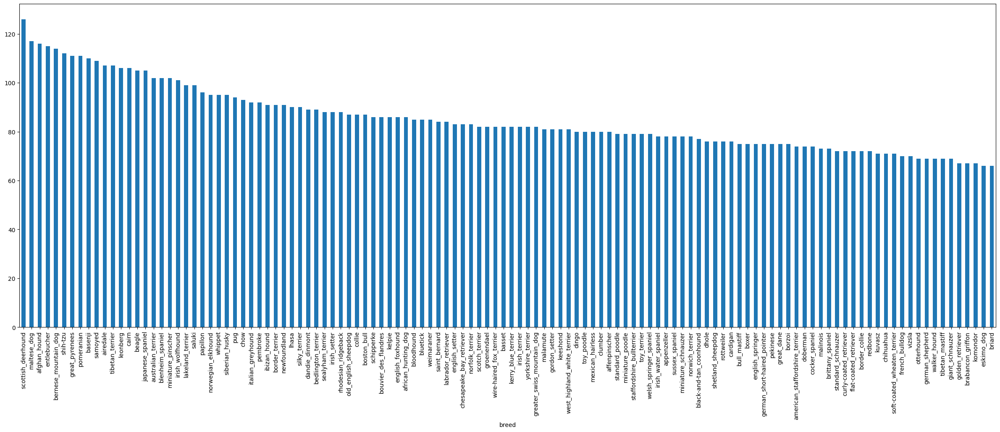

In [13]:
from re import L
#How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize = (30,10));

In [14]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
brabancon_griffon,67
komondor,67


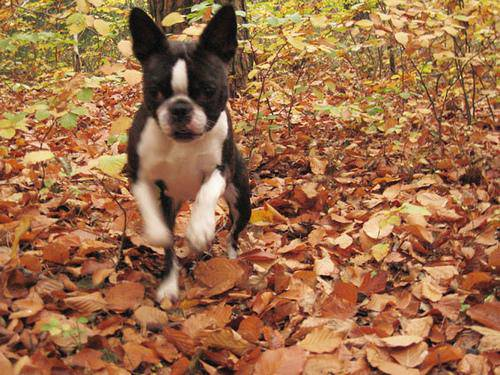

In [15]:
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [16]:
#Create pathnames from the image ID's
filenames = ["drive/MyDrive/Dog Vision/train/" +  fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [17]:
#Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("same number of the file exist")
else:
  print("diff number of the file exists")

same number of the file exist


In [18]:
# Check an image directly from a filepath
labels_csv["breed"][9000]

'tibetan_mastiff'

In [19]:
#create the labels
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [20]:
#See if the number of the labels are same as the number of the files
if len(labels)==len(filenames):
  print("Numbers are same")
else:
  print("Numbers are different")

Numbers are same


In [21]:
#find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [22]:
len(unique_breeds)

120

In [23]:
#Turn a single labels into the boolean
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [24]:
#Turn every label into a boolean label
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [25]:
len(boolean_labels)

10222

In [26]:
#Example: Turning boolean array into the labels
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])[0][0]) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [27]:
#Creating our own data set
X = filenames
y = boolean_labels

In [28]:
len(filenames)

10222

In [29]:
#We are going to start off the experimenting with 1000 images and increase as neede

In [30]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max : 1}

In [31]:
#split them into training and validation of total size NUM_IMAGES
from sklearn.model_selection import train_test_split
#split the data into trainig and validation
np.random.seed(42) #reproduce
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=(42))

In [32]:
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [33]:
#lets have alook at train data
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

In [34]:
#Preprocessing Images (turning images into the tensors)
# To preprocess our images into Tensors we are going to write a function which does a few things:
#1. Take an image filepath as input
#2. Use Tensorflow to read the file and save it to a variable, images
#3. Resize the image to be shape of (224, 224)
#4. Return a modified image

In [35]:
#convert image into the numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [36]:
image.max(), image.min()

(255, 0)

In [37]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [38]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [39]:
#Now we have seen how an image look like a tesnor
#Now we need to make one

In [40]:
#Define image size

In [41]:
IMG_SIZE = 224
#create a function for preprocessing
#Create a function for preprocessing images
def process_image(image_path):
  '''
  take an image path as input and converts it into the tensor
  '''
  #Read in an image file
  image = tf.io.read_file(image_path)
  #Turn the jpeg image into numerical Tensor with 3 colors
  image = tf.image.decode_jpeg(image, channels=3)
  #convert the color channels values from -255 to 255
  image = tf.image.convert_image_dtype(image, tf.float32)
  #resize the image to our desired image size(224,224)
  image = tf.image.resize(image, size =(IMG_SIZE, IMG_SIZE))
  return image

In [42]:
#turn the dataset into the batches
# What's a batch?

# A batch (also called mini-batch) is a small portion of your data, say 32 (32 is generally the default batch size) images and their labels. In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time.

# Let's say you're dealing with 10,000+ images (which we are). Together, these files may take up more memory than your GPU has. Trying to compute on them all would result in an error.

# Instead, it's more efficient to create smaller batches of your data and compute on one batch at a time.

# TensorFlow is very efficient when your data is in batches of (image, label) Tensors. So we'll build a function to do create those first. We'll take advantage of of process_image function at the same time.

In [43]:
#create a simple function to return a tuple(image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [44]:
#demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [45]:
#batches of size 32
#above is the data into tuples of tensors
#convert it into the tuples

In [46]:
#define the batch size, 32 is a good start
BATCH_SIZE = 32
#Create a functiom to turn the data into the batches
def create_data_batches(X, y =None, batch_size=BATCH_SIZE, valid_data= False, test_data=False):
  '''
    Create batches of data out of image(X) and label(y) pairs
    Shuffles the data if its training data but doesn't shuffle if it is validation data
  '''
  #If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepath
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  #if the data is a valid dataset, we dont need to shiffle it
  elif valid_data:
    print("Creating the validation data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    #turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [47]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating the validation data batches..


In [48]:
#check out the different attributes of out data
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [49]:
#visualize the data batches
#Our data is now in batches
import matplotlib.pyplot as plt
#create a function for viewing images in a data batch
def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    #create subplots(5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    #display an image
    plt.imshow(images[i])
    #add the images label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #turn the grid lines off
    plt.axis("off")

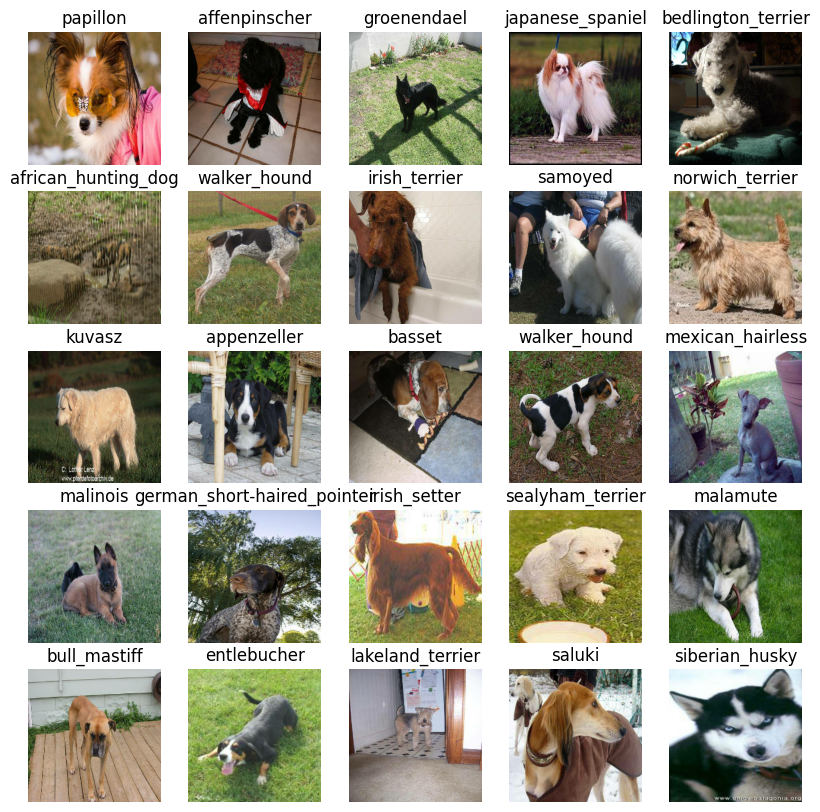

In [50]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [51]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

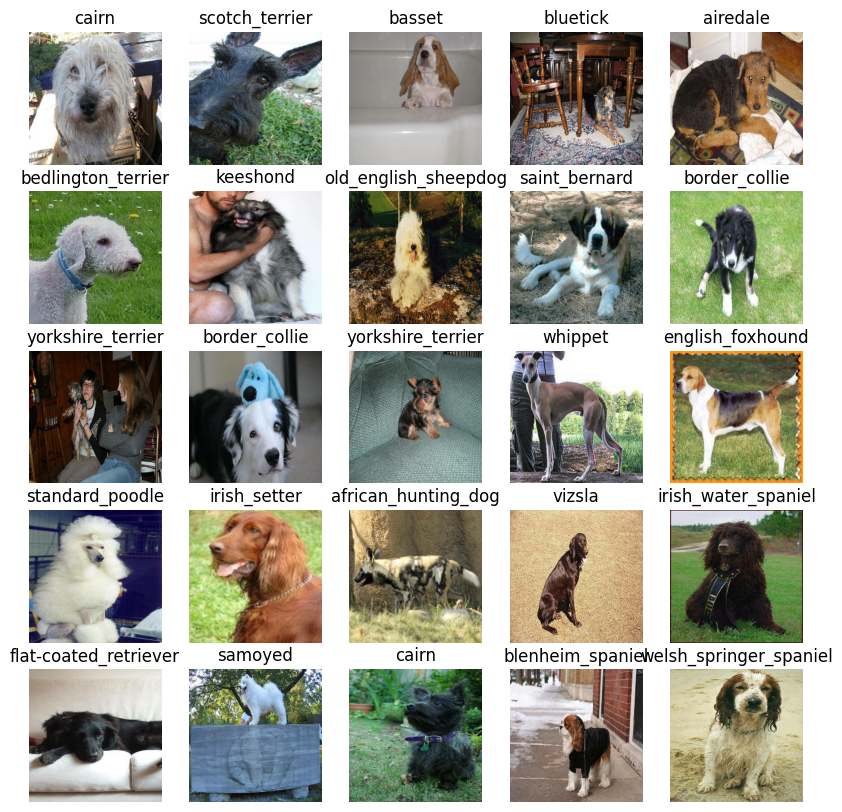

In [52]:
# Visualize val images from the training data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [53]:
#Building a model
#Before we build a model, there are few things we need to define:
## The inpout shape in form of the tensors to our model
## The output shape in form of the tensors to our model
## The url of the model we want to use


In [54]:
#set up input shape of the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
#setup the output shape
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

In [55]:
#Before we got our inputs, outputs and model ready to go.
#Knowing this, let's create a function which:
# Take the input shape, output shape and the model we have chosen as parameters
# Defines the layers in keras model in sequential fashion
# Compiles the model (says it should be evaluated and improved)
#Builds the model (tells the model tthe inout shape)

In [56]:
#creates a function which builds a Keras model
#imports
# !pip install tf_keras
import tf_keras
def create_model(input_shape = INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with: ", MODEL_URL)
  #set up the model layers
  model = tf_keras.Sequential([hub.KerasLayer(MODEL_URL), #Layer(input)
                               tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation="softmax") #Layer(output
                               ])
  #compile a model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(),
      optimizer = tf_keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )
  #build a model
  model.build(INPUT_SHAPE)
  return model

In [57]:
model = create_model()
model.summary()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [58]:
#Creating the callback

In [59]:
#The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

In [60]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [61]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Data",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

In [62]:
create_tensorboard_callback()

In [63]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements
early_stopping

In [64]:
#training the model(on subset of data)
#our first model will be train on the 1000 images

In [65]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a simple function which trains a model. The function will:

Create a model using create_model().
Setup a TensorBoard callback using create_tensorboard_callback() (we do this here so it creates a log directory of the current date and time).
Call the fit() function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
Return the fitted model.


In [66]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  return model

In [67]:
# Fit the model to the data
model = train_model()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 294s 12s/step - loss: 4.6540 - accuracy: 0.0913 - val_loss: 3.5366 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 52s 2s/step - loss: 1.7060 - accuracy: 0.6938 - val_loss: 2.3088 - val_accuracy: 0.4500
Epoch 3/100
25/25 [==============================] - 53s 2s/step - loss: 0.5920 - accuracy: 0.9262 - val_loss: 1.7518 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 62s 2s/step - loss: 0.2602 - accuracy: 0.9850 - val_loss: 1.5618 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 52s 2s/step - loss: 0.1485 - accuracy: 0.9975 - val_loss: 1.4855 - val_accuracy: 0.6000
Epoch 6/100
25/25 [==============================] - 64s 3s/step - loss: 0.1014 - accuracy: 0.9987 - val_loss: 1.4522 - val_accuracy: 0.6200
Epoch 7/100
25/25 [========================

In [68]:
%tensorboard --logdir /content/drive/MyDrive/Data

<IPython.core.display.Javascript object>

In [69]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 24s 2s/step


array([[1.44606267e-04, 3.02659610e-04, 1.92660678e-04, ...,
        1.82117103e-04, 7.07767176e-05, 1.44264465e-02],
       [3.93631257e-04, 1.30846485e-04, 8.80827382e-03, ...,
        1.40949711e-03, 3.97438975e-03, 9.29713788e-05],
       [8.14816303e-05, 1.24922473e-04, 9.54482821e-05, ...,
        1.06733307e-04, 2.11972929e-05, 2.44729599e-04],
       ...,
       [4.93081352e-05, 1.16078416e-03, 2.62856745e-04, ...,
        2.92824698e-05, 1.50556312e-04, 9.82130223e-05],
       [1.87724188e-03, 5.76389546e-04, 3.98137381e-05, ...,
        1.99008908e-04, 1.86814596e-05, 1.29022086e-02],
       [9.00961604e-05, 1.09902830e-04, 1.34841457e-03, ...,
        9.68677225e-04, 1.61667078e-04, 1.21984303e-04]], dtype=float32)

In [70]:
# Check the shape of predictions
predictions.shape

(200, 120)

In [71]:
len(predictions[0])

120

In [77]:
# First prediction
index = 51
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[index])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[index])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}") # the predicted label

[8.19016204e-05 9.90526896e-05 8.57764389e-05 1.54335314e-04
 6.36270779e-05 7.44330464e-06 6.21592117e-05 5.44973182e-06
 5.36249194e-04 1.62379013e-03 7.78653286e-03 2.39412329e-05
 1.76966481e-03 6.69568893e-04 2.39922968e-03 4.33039793e-04
 2.64044909e-04 1.44242076e-04 3.25160399e-05 2.76158298e-05
 8.51610443e-04 6.60581456e-04 2.30006208e-05 7.62214695e-05
 1.02725590e-03 1.74279115e-03 1.71808115e-05 1.48715537e-06
 2.50802606e-01 1.00948928e-04 1.14135073e-05 3.56701901e-03
 6.21446583e-04 2.81379544e-05 7.87964789e-04 3.08465504e-04
 7.71935680e-04 1.34109432e-04 6.19284809e-04 1.09971454e-03
 6.87445514e-04 3.80863207e-06 1.87606129e-04 1.06885884e-04
 6.46783621e-04 7.97028042e-05 2.53927319e-05 3.75917158e-03
 1.03789593e-04 1.26912515e-03 6.28447102e-04 6.36793207e-04
 5.64222100e-05 2.23206240e-03 1.53411329e-05 1.43412792e-04
 2.93804478e-04 7.42203629e-05 1.02337648e-03 5.00126771e-05
 1.40524833e-04 1.47579907e-04 1.96649380e-05 5.89128422e-06
 8.08304103e-05 9.854629

In [78]:
unique_breeds[113]

'walker_hound'

In [79]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [82]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

The first function we'll create will:

Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
Convert the prediction probabilities to a predicted label.
Plot the predicted label, its predicted probability, the truth label and target image on a single plot.


In [83]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

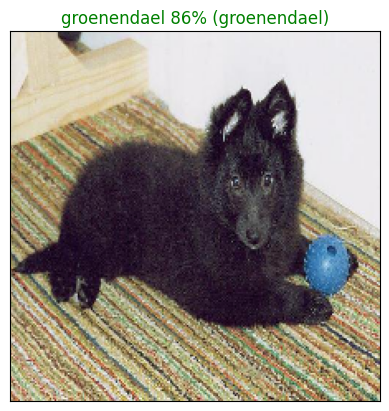

In [86]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Let's build a function to demonstrate. The function will:

Take an input of a prediction probabilities array, a ground truth labels array and an integer.
Find the predicted label using get_pred_label().
Find the top 10:
Prediction probabilities indexes
Prediction probabilities values
Prediction labels
Plot the top 10 prediction probability values and labels, coloring the true label green.

In [87]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

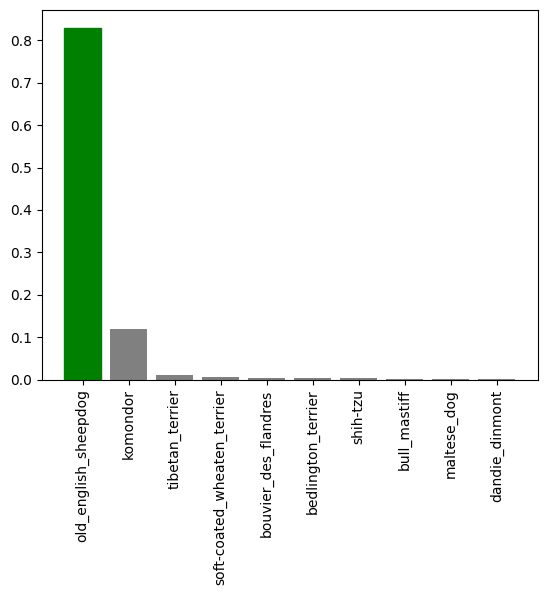

In [90]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=7)

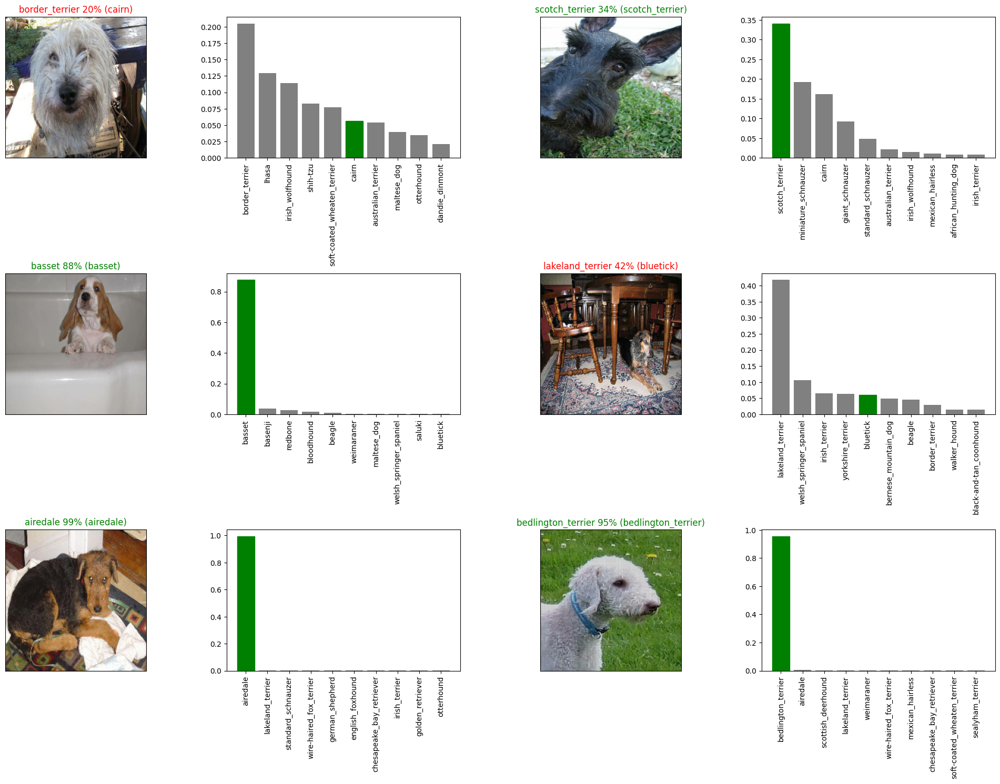

In [91]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [92]:
#saving and reloading the model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [96]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [97]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Data/models/20240913-11171726226274-1000-images-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Data/models/20240913-11171726226274-1000-images-Adam.h5'

In [101]:
model_1000_images = load_model("drive/My Drive/Data/models/20240913-11151726226151-1000-images-Adam.h5")

Loading saved model from: drive/My Drive/Data/models/20240913-11151726226151-1000-images-Adam.h5


In [102]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 12s 2s/step - loss: 1.3550 - accuracy: 0.6400


[1.3550400733947754, 0.6399999856948853]

In [103]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 11s 1s/step - loss: 1.3550 - accuracy: 0.6400


[1.3550400733947754, 0.6399999856948853]